In [1]:
# %% [markdown]
# # 🎧 Reconstruct Audio Using Per-Frequency Complex Gain (Option 1)
# 
# This notebook:
# 1. Loads a **clean** and a **noisy** audio file.
# 2. Estimates the **per-frequency complex gain** `G(f)` that transforms clean → noisy.
# 3. Reconstructs the noisy signal by applying `G(f)` to the clean audio.
# 4. Plays both audios for comparison (no file saving).

# %%
import numpy as np
import soundfile as sf
from scipy.signal import stft, istft, get_window, correlate
import IPython.display as ipd

from param import clean_audio, noise_audio, new_clean_audio, new_noise_audio

# %% [markdown]
# ## 1️⃣ Utility functions

# %%
def to_mono(x):
    """Convert stereo -> mono if needed."""
    return x.mean(axis=1) if x.ndim == 2 else x

def align_by_xcorr(ref, sig, max_lag=None):
    """
    Align `sig` to `ref` by maximizing cross-correlation.
    Returns (aligned_signal, lag_samples).
    """
    n = min(len(ref), len(sig))
    ref, sig = ref[:n], sig[:n]
    xcorr = correlate(sig, ref, mode="full")
    lags = np.arange(-n + 1, n)

    if max_lag is not None:
        mask = (lags >= -max_lag) & (lags <= max_lag)
        xcorr, lags = xcorr[mask], lags[mask]

    lag = lags[np.argmax(xcorr)]

    if lag > 0:  # shift right
        sig = np.pad(sig, (lag, 0))[:n]
    elif lag < 0:  # shift left
        sig = np.pad(sig[-lag:], (0, -lag))[:n]
    return sig, lag

# %% [markdown]
# ## 2️⃣ Load audio files

# %%
# 🔧 Change these paths to your own audio files
clean_path = clean_audio
noisy_path = noise_audio

# Load and convert to mono
x, sr_c = sf.read(clean_path)
y, sr_n = sf.read(noisy_path)
x, y = to_mono(x.astype(np.float32)), to_mono(y.astype(np.float32))

# Make sure both have the same sample rate
if sr_c != sr_n:
    raise ValueError(f"Sample rate mismatch: {sr_c} vs {sr_n}")

# Align the noisy signal to the clean reference
y_aligned, lag = align_by_xcorr(x, y, max_lag=sr_c)
print(f"Lag alignment: {lag} samples")

# %%
# Normalize both signals
x /= np.max(np.abs(x) + 1e-12)
y_aligned /= np.max(np.abs(y_aligned) + 1e-12)

# %% [markdown]
# ## 3️⃣ Compute per-frequency complex gain and reconstruct

# %%
n_fft = 4096
hop = 1024
win = get_window("hann", n_fft, fftbins=True)

# Short-Time Fourier Transform (STFT)
f, t, X = stft(x, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop)
_, _, Y = stft(y_aligned, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop)

# Compute complex gain per frequency
eps = 1e-12
num = np.sum(Y * np.conj(X), axis=1)
den = np.sum(np.abs(X) ** 2, axis=1) + eps
G = num / den  # complex gain vector

# Apply gain to clean signal's spectrogram
Y_rec = G[:, None] * X

# Inverse STFT to get reconstructed waveform
_, y_rec = istft(Y_rec, fs=sr_c, nperseg=n_fft, noverlap=n_fft - hop)

# Normalize reconstructed audio
y_rec /= np.max(np.abs(y_rec) + 1e-12)

print("Reconstruction complete.")

# %% [markdown]
# ## 4️⃣ Listen to the results

# %%
print("▶️ Original (clean) audio:")
ipd.display(ipd.Audio(x, rate=sr_c))

# %%
print("▶️ True noisy audio (reference):")
ipd.display(ipd.Audio(y_aligned, rate=sr_c))

# %%
print("▶️ Reconstructed noisy audio (from per-frequency gain):")
ipd.display(ipd.Audio(y_rec, rate=sr_c))

# %% [markdown]
# ---
# ## ✅ Notes
# - This reconstruction applies a **single averaged complex gain per frequency**.
# - It preserves **phase** and **spectral coloration**, but not fine time variation.
# - The reconstructed output (`y_rec`) is stored in memory and playable.


Lag alignment: 1062 samples
Reconstruction complete.
▶️ Original (clean) audio:


▶️ True noisy audio (reference):


▶️ Reconstructed noisy audio (from per-frequency gain):


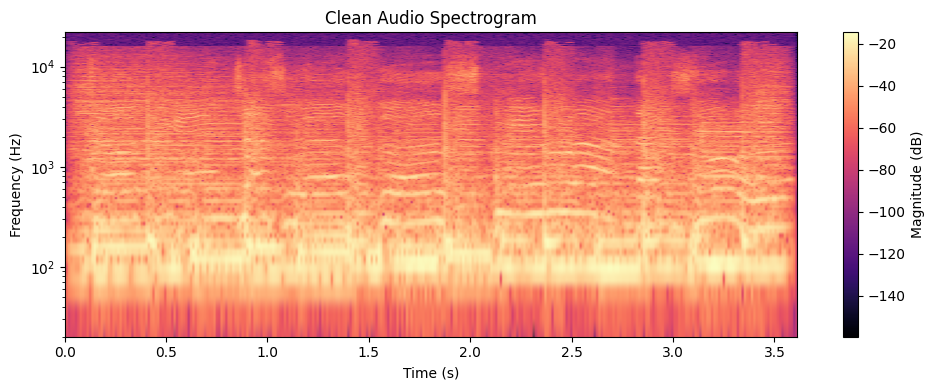

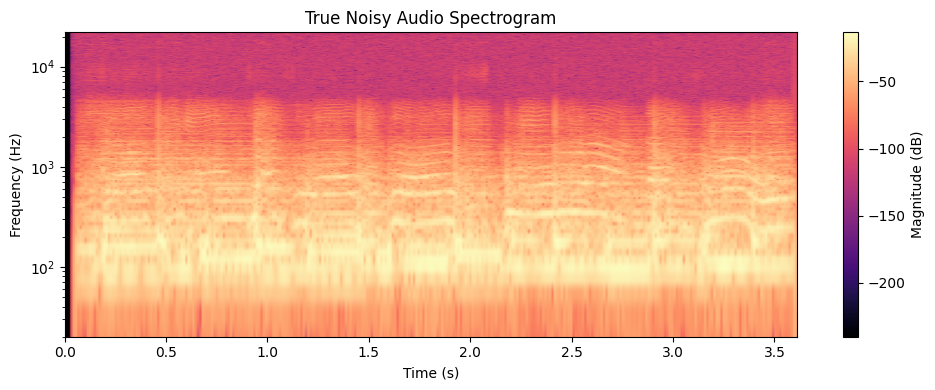

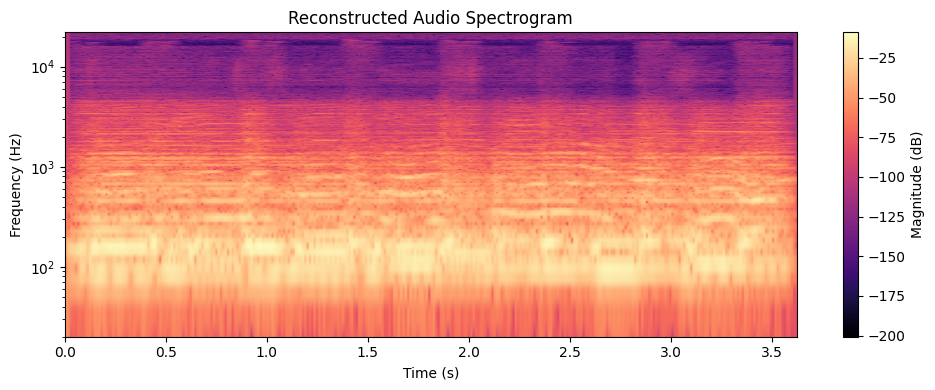

In [2]:
# %% [markdown]
# ## 5️⃣ Visualize Spectrogram Comparison

# %%
import matplotlib.pyplot as plt

def plot_spectrogram(audio, sr, title, n_fft=2048, hop=512):
    f, t, Zxx = stft(audio, fs=sr, nperseg=n_fft, noverlap=n_fft - hop)
    magnitude_db = 20 * np.log10(np.abs(Zxx) + 1e-12)
    plt.figure(figsize=(10, 4))
    plt.imshow(
        magnitude_db,
        origin="lower",
        aspect="auto",
        extent=[t.min(), t.max(), f.min(), f.max()],
        cmap="magma"
    )
    plt.yscale("log")
    plt.ylim(20, sr/2)
    plt.colorbar(label="Magnitude (dB)")
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.tight_layout()
    plt.show()

# %%
plot_spectrogram(x, sr_c, "Clean Audio Spectrogram")
plot_spectrogram(y_aligned, sr_c, "True Noisy Audio Spectrogram")
plot_spectrogram(y_rec, sr_c, "Reconstructed Audio Spectrogram")


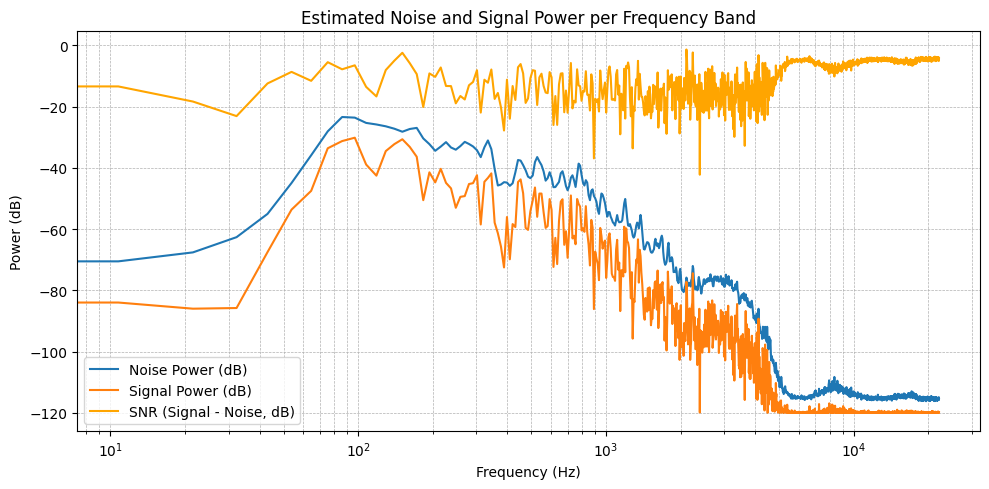

In [3]:
# %% [markdown]
# ## 6️⃣.5 Visualize Noise Energy per Frequency

# %%
# Compute residual between true noisy STFT and reconstructed one
R = Y - (G[:, None] * X)
noise_power = np.mean(np.abs(R) ** 2, axis=1)
signal_power = np.mean(np.abs(G[:, None] * X) ** 2, axis=1)

# Convert to decibels
eps = 1e-12
noise_db = 10 * np.log10(noise_power + eps)
signal_db = 10 * np.log10(signal_power + eps)
snr_db = signal_db - noise_db

# Plot
plt.figure(figsize=(10,5))
plt.semilogx(f, noise_db, label="Noise Power (dB)")
plt.semilogx(f, signal_db, label="Signal Power (dB)")
plt.semilogx(f, snr_db, label="SNR (Signal - Noise, dB)", color='orange')
plt.title("Estimated Noise and Signal Power per Frequency Band")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power (dB)")
plt.grid(True, which="both", ls="--", lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()


Noise Power (dB) → how much residual (difference) energy exists at each frequency.

Signal Power (dB) → reconstructed main energy.

SNR (dB) → difference between the two, showing how much each frequency was attenuated or boosted.

In [4]:
# %% [markdown]
# ## 6️⃣ Apply the learned G(f) to a different audio and compare with Ground Truth

# %%
def apply_gain_to_new_audio(new_audio_path, G, sr_ref, n_fft=4096, hop=1024):
    """Apply the previously learned complex gain G(f) to a new clean audio file."""
    z, sr_z = sf.read(new_audio_path)
    z = to_mono(z.astype(np.float32))
    if sr_z != sr_ref:
        raise ValueError(f"Sample rate mismatch: {sr_z} vs {sr_ref}")
    
    # STFT
    f, t, Z = stft(z, fs=sr_z, nperseg=n_fft, noverlap=n_fft - hop)
    
    # Apply frequency response G
    G_stretched = np.interp(f, np.linspace(0, sr_ref/2, len(G)), np.real(G)) \
                  + 1j * np.interp(f, np.linspace(0, sr_ref/2, len(G)), np.imag(G))
    
    Z_new = G_stretched[:, None] * Z
    _, z_new = istft(Z_new, fs=sr_z, nperseg=n_fft, noverlap=n_fft - hop)
    
    # Normalize
    z_new /= np.max(np.abs(z_new) + 1e-12)
    return z, z_new, sr_z

# %%
# 🔧 Define paths
new_audio_path = new_clean_audio
ground_truth_path = new_noise_audio

# Apply the learned G(f)
z, z_new, sr_z = apply_gain_to_new_audio(new_audio_path, G, sr_c)

# Load ground truth noisy version
gt_audio, sr_gt = sf.read(ground_truth_path)
gt_audio = to_mono(gt_audio.astype(np.float32))
gt_audio /= np.max(np.abs(gt_audio) + 1e-12)

# %%
print("▶️ Original new clean audio:")
ipd.display(ipd.Audio(z, rate=sr_z))

print("▶️ New audio with learned noise applied:")
ipd.display(ipd.Audio(z_new, rate=sr_z))

print("▶️ Ground Truth noisy audio:")
ipd.display(ipd.Audio(gt_audio, rate=sr_gt))


▶️ Original new clean audio:


▶️ New audio with learned noise applied:


▶️ Ground Truth noisy audio:


In [5]:
# %% [markdown]
# ## 6️⃣ Apply the learned G(f) to a different audio and compare with Ground Truth

# %%
def apply_gain_to_new_audio(new_audio_path, G, sr_ref, n_fft=4096, hop=1024):
    """Apply the previously learned complex gain G(f) to a new clean audio file."""
    z, sr_z = sf.read(new_audio_path)
    z = to_mono(z.astype(np.float32))
    if sr_z != sr_ref:
        raise ValueError(f"Sample rate mismatch: {sr_z} vs {sr_ref}")
    
    # STFT
    f, t, Z = stft(z, fs=sr_z, nperseg=n_fft, noverlap=n_fft - hop)
    
    # Apply frequency response G
    G_stretched = np.interp(f, np.linspace(0, sr_ref/2, len(G)), np.real(G)) \
                  + 1j * np.interp(f, np.linspace(0, sr_ref/2, len(G)), np.imag(G))
    
    Z_new = G_stretched[:, None] * Z
    _, z_new = istft(Z_new, fs=sr_z, nperseg=n_fft, noverlap=n_fft - hop)
    
    # Normalize
    z_new /= np.max(np.abs(z_new) + 1e-12)
    return z, z_new, sr_z

# %%
# 🔧 Define paths
new_audio_path = new_clean_audio
ground_truth_path = new_noise_audio

# Apply the learned G(f)
z, z_new, sr_z = apply_gain_to_new_audio(new_audio_path, G, sr_c)

# Load ground truth noisy version
gt_audio, sr_gt = sf.read(ground_truth_path)
gt_audio = to_mono(gt_audio.astype(np.float32))
gt_audio /= np.max(np.abs(gt_audio) + 1e-12)

# %%
print("▶️ Original new clean audio:")
ipd.display(ipd.Audio(z, rate=sr_z))

print("▶️ New audio with learned noise applied:")
ipd.display(ipd.Audio(z_new, rate=sr_z))

print("▶️ Ground Truth noisy audio:")
ipd.display(ipd.Audio(gt_audio, rate=sr_gt))


▶️ Original new clean audio:


▶️ New audio with learned noise applied:


▶️ Ground Truth noisy audio:


## Another approach

Lag alignment: 1062 samples
Reconstruction complete.
▶️ Clean audio:


▶️ True noisy audio:


▶️ Reconstructed audio:


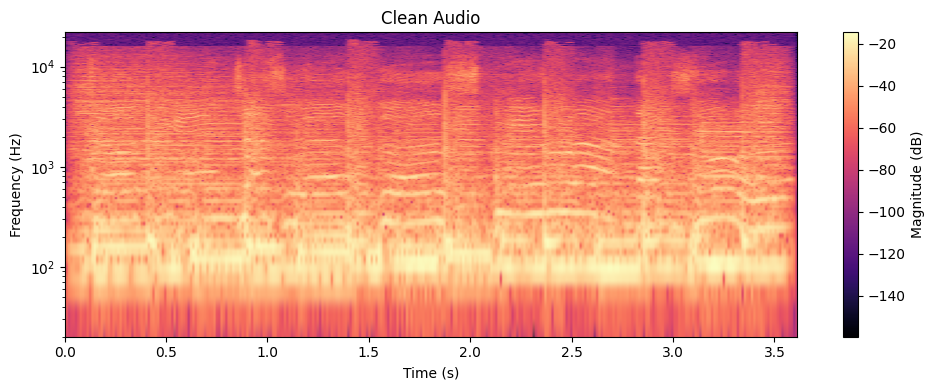

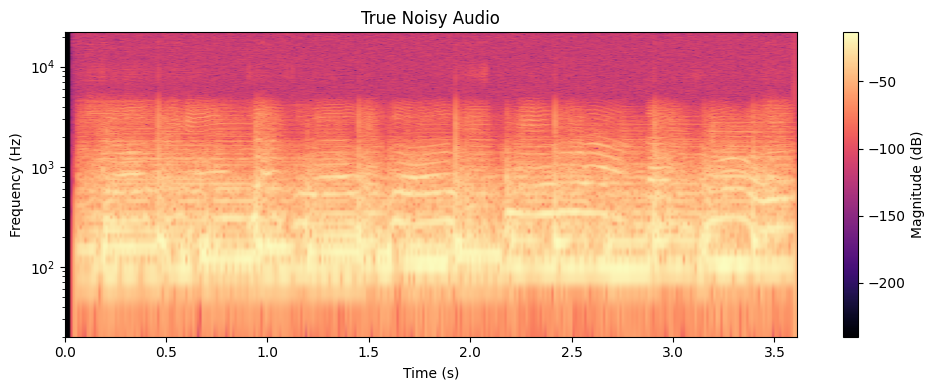

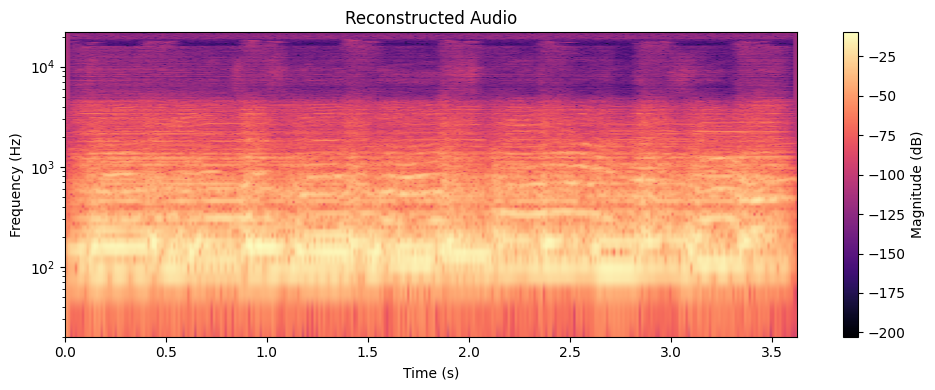

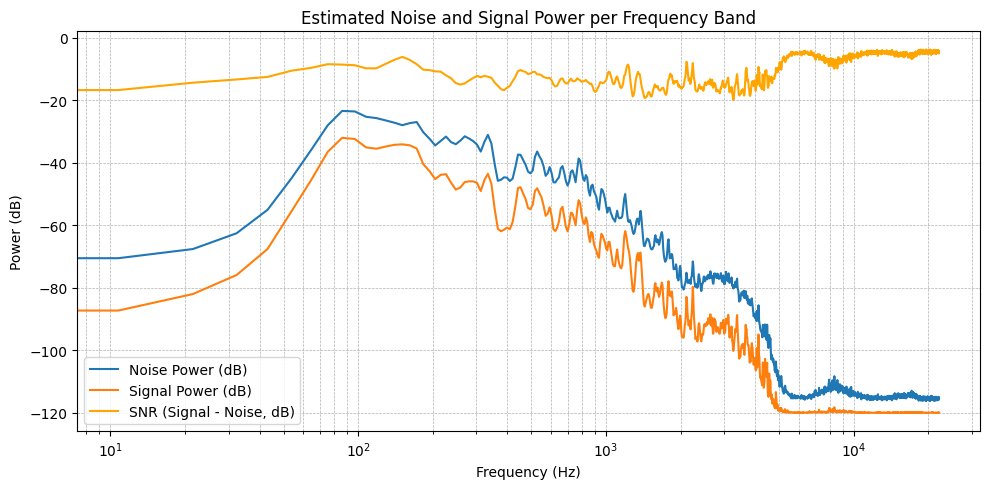

▶️ Original new clean audio:


▶️ New audio with learned noise applied:


▶️ Ground truth noisy audio:


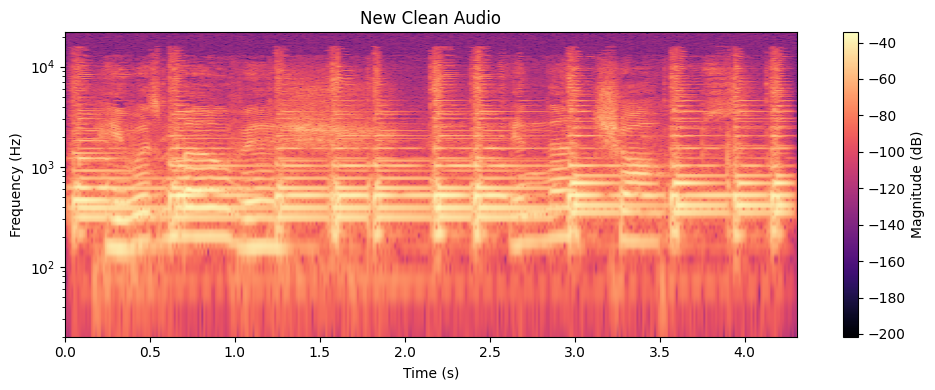

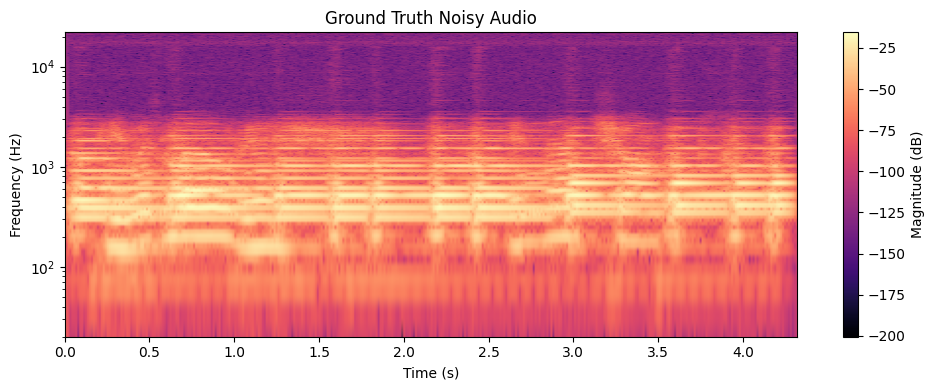

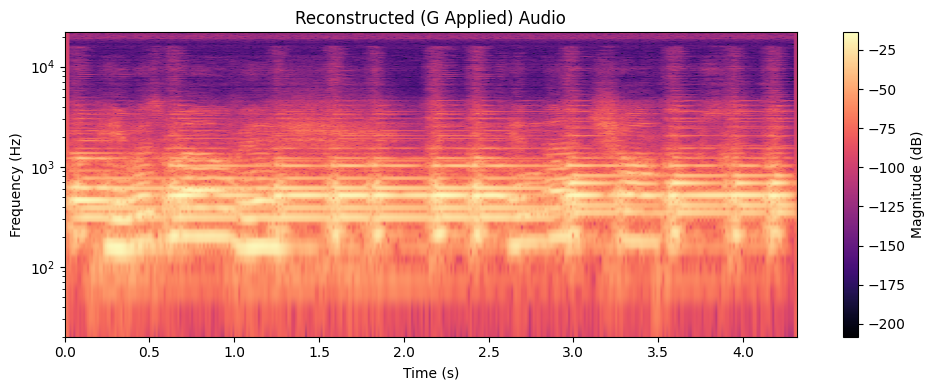

In [6]:
# %% [markdown]
# # 🎧 Reconstruct Audio Using Per-Frequency Complex Gain (Option 1)
# 
# Steps:
# 1. Load a **clean** and a **noisy** audio file.
# 2. Estimate the **per-frequency complex gain** `G(f)` that transforms clean → noisy.
# 3. Reconstruct the noisy signal by applying `G(f)` to the clean audio.
# 4. Play and visualize everything — no file saving needed.

# %%
import numpy as np
import soundfile as sf
from scipy.signal import stft, istft, get_window, correlate
import IPython.display as ipd
import matplotlib.pyplot as plt
import scipy.ndimage as ndi

from param import clean_audio, noise_audio, new_clean_audio, new_noise_audio

# %% [markdown]
# ## 1️⃣ Utility functions

# %%
def to_mono(x):
    """Convert stereo → mono if needed."""
    return x.mean(axis=1) if x.ndim == 2 else x

def align_by_xcorr(ref, sig, max_lag=None):
    """
    Align `sig` to `ref` by maximizing cross-correlation.
    Returns (aligned_signal, lag_samples).
    """
    n = min(len(ref), len(sig))
    ref, sig = ref[:n], sig[:n]
    xcorr = correlate(sig, ref, mode="full")
    lags = np.arange(-n + 1, n)

    if max_lag is not None:
        mask = (lags >= -max_lag) & (lags <= max_lag)
        xcorr, lags = xcorr[mask], lags[mask]

    lag = lags[np.argmax(xcorr)]
    if lag > 0:
        sig = np.pad(sig, (lag, 0))[:n]
    elif lag < 0:
        sig = np.pad(sig[-lag:], (0, -lag))[:n]
    return sig, lag

# %% [markdown]
# ## 2️⃣ Load audio and align

# %%
clean_path = clean_audio
noisy_path = noise_audio

x, sr_c = sf.read(clean_path)
y, sr_n = sf.read(noisy_path)
x, y = to_mono(x.astype(np.float32)), to_mono(y.astype(np.float32))

if sr_c != sr_n:
    raise ValueError(f"Sample rate mismatch: {sr_c} vs {sr_n}")

y_aligned, lag = align_by_xcorr(x, y, max_lag=sr_c)
print(f"Lag alignment: {lag} samples")

x /= np.max(np.abs(x) + 1e-12)
y_aligned /= np.max(np.abs(y_aligned) + 1e-12)

# %% [markdown]
# ## 3️⃣ Estimate per-frequency gain and reconstruct

# %%
n_fft, hop = 4096, 1024
win = get_window("hann", n_fft, fftbins=True)

f, t, X = stft(x, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop)
_, _, Y = stft(y_aligned, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop)

eps = 1e-12
num = np.sum(Y * np.conj(X), axis=1)
den = np.sum(np.abs(X) ** 2, axis=1) + eps
G = num / den
f_G = f.copy()  # frequency axis

# Optional smoothing (makes G(f) smoother)
G_mag = np.abs(G)
G_phase = np.angle(G)
G_mag_smooth = ndi.gaussian_filter1d(G_mag, sigma=2)
G_smooth = G_mag_smooth * np.exp(1j * G_phase)
G = G_smooth

# Reconstruct
Y_rec = G[:, None] * X
_, y_rec = istft(Y_rec, fs=sr_c, nperseg=n_fft, noverlap=n_fft - hop)
y_rec /= np.max(np.abs(y_rec) + 1e-12)
print("Reconstruction complete.")

# %% [markdown]
# ## 4️⃣ Listen to the results

# %%
print("▶️ Clean audio:")
ipd.display(ipd.Audio(x, rate=sr_c))

print("▶️ True noisy audio:")
ipd.display(ipd.Audio(y_aligned, rate=sr_c))

print("▶️ Reconstructed audio:")
ipd.display(ipd.Audio(y_rec, rate=sr_c))

# %% [markdown]
# ## 5️⃣ Visualize Spectrograms

# %%
def plot_spectrogram(audio, sr, title, n_fft=2048, hop=512):
    f, t, Zxx = stft(audio, fs=sr, nperseg=n_fft, noverlap=n_fft - hop)
    mag_db = 20 * np.log10(np.abs(Zxx) + 1e-12)
    plt.figure(figsize=(10, 4))
    plt.imshow(
        mag_db,
        origin="lower",
        aspect="auto",
        extent=[t.min(), t.max(), f.min(), f.max()],
        cmap="magma"
    )
    plt.yscale("log")
    plt.ylim(20, sr / 2)
    plt.colorbar(label="Magnitude (dB)")
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.tight_layout()
    plt.show()

plot_spectrogram(x, sr_c, "Clean Audio")
plot_spectrogram(y_aligned, sr_c, "True Noisy Audio")
plot_spectrogram(y_rec, sr_c, "Reconstructed Audio")

# %% [markdown]
# ## 6️⃣ Noise Energy per Frequency

# %%
R = Y - (G[:, None] * X)
noise_power = np.mean(np.abs(R) ** 2, axis=1)
signal_power = np.mean(np.abs(G[:, None] * X) ** 2, axis=1)

eps = 1e-12
noise_db = 10 * np.log10(noise_power + eps)
signal_db = 10 * np.log10(signal_power + eps)
snr_db = signal_db - noise_db

plt.figure(figsize=(10, 5))
plt.semilogx(f, noise_db, label="Noise Power (dB)")
plt.semilogx(f, signal_db, label="Signal Power (dB)")
plt.semilogx(f, snr_db, label="SNR (Signal - Noise, dB)", color="orange")
plt.title("Estimated Noise and Signal Power per Frequency Band")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power (dB)")
plt.grid(True, which="both", ls="--", lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# %% [markdown]
# ## 7️⃣ Apply G(f) to New Audio and Compare with Ground Truth

# %%
def apply_gain_to_new_audio(new_audio_path, G, f_G, sr_ref, n_fft=4096, hop=1024):
    """Apply the previously learned complex gain G(f) to a new clean audio file."""
    z, sr_z = sf.read(new_audio_path)
    z = to_mono(z.astype(np.float32))
    if sr_z != sr_ref:
        raise ValueError(f"Sample rate mismatch: {sr_z} vs {sr_ref}")

    f_new, t_new, Z = stft(z, fs=sr_z, nperseg=n_fft, noverlap=n_fft - hop)

    # Interpolate G to match new frequency bins
    G_real = np.interp(f_new, f_G, np.real(G))
    G_imag = np.interp(f_new, f_G, np.imag(G))
    G_interp = G_real + 1j * G_imag

    Z_new = G_interp[:, None] * Z
    _, z_new = istft(Z_new, fs=sr_z, nperseg=n_fft, noverlap=n_fft - hop)
    z_new /= np.max(np.abs(z_new) + 1e-12)
    return z, z_new, sr_z

# %%
new_audio_path = new_clean_audio
ground_truth_path = new_noise_audio

z, z_new, sr_z = apply_gain_to_new_audio(new_audio_path, G, f_G, sr_c)

gt_audio, sr_gt = sf.read(ground_truth_path)
gt_audio = to_mono(gt_audio.astype(np.float32))
gt_audio /= np.max(np.abs(gt_audio) + 1e-12)

print("▶️ Original new clean audio:")
ipd.display(ipd.Audio(z, rate=sr_z))
print("▶️ New audio with learned noise applied:")
ipd.display(ipd.Audio(z_new, rate=sr_z))
print("▶️ Ground truth noisy audio:")
ipd.display(ipd.Audio(gt_audio, rate=sr_gt))

# %% [markdown]
# ## 8️⃣ Compare Spectrograms

# %%
plot_spectrogram(z, sr_z, "New Clean Audio")
plot_spectrogram(gt_audio, sr_gt, "Ground Truth Noisy Audio")
plot_spectrogram(z_new, sr_z, "Reconstructed (G Applied) Audio")


In [7]:
# %% [markdown]
# ## 3️⃣ Compute Per-Frame Complex Gain and Reconstruct (Dynamic Version)

# %%
n_fft = 4096
hop = 1024
win = get_window("hann", n_fft, fftbins=True)

# --- STFT ---
f, t, X = stft(x, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop)
_, _, Y = stft(y_aligned, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop)

# --- Compute per-frame complex gain ---
eps = 1e-12
G_ft = (Y * np.conj(X)) / (np.abs(X) ** 2 + eps)  # shape: [freq, time]

# --- Optional smoothing over time to avoid harsh frame-to-frame jumps ---
import scipy.ndimage as ndi
G_ft_smooth = ndi.gaussian_filter(G_ft, sigma=(0, 2))  # (freq_smooth, time_smooth)

# --- Reconstruct the noisy audio ---
Y_rec_dynamic = G_ft_smooth * X
_, y_rec_dynamic = istft(Y_rec_dynamic, fs=sr_c, nperseg=n_fft, noverlap=n_fft - hop)

# --- Normalize ---
y_rec_dynamic /= np.max(np.abs(y_rec_dynamic) + 1e-12)

print("Dynamic reconstruction complete (per-frame complex gain).")

# %% [markdown]
# ## 🎧 Listen to Results

# %%
print("▶️ Clean audio:")
ipd.display(ipd.Audio(x, rate=sr_c))

print("▶️ True noisy audio:")
ipd.display(ipd.Audio(y_aligned, rate=sr_c))

print("▶️ Reconstructed (Dynamic per-frame gain):")
ipd.display(ipd.Audio(y_rec_dynamic, rate=sr_c))


Dynamic reconstruction complete (per-frame complex gain).
▶️ Clean audio:


▶️ True noisy audio:


▶️ Reconstructed (Dynamic per-frame gain):


▶️ Clean audio:


▶️ True noisy audio:


▶️ Dynamic reconstructed noisy audio:


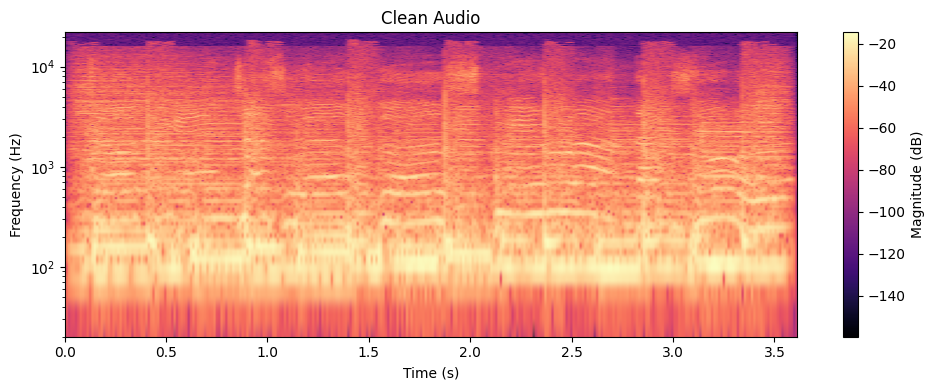

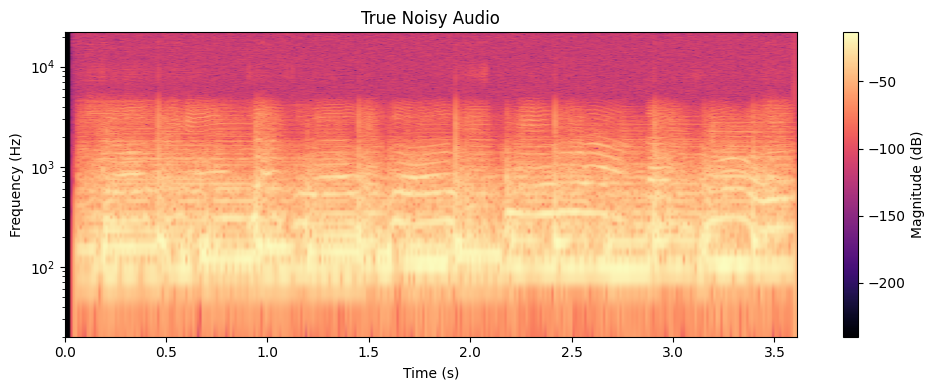

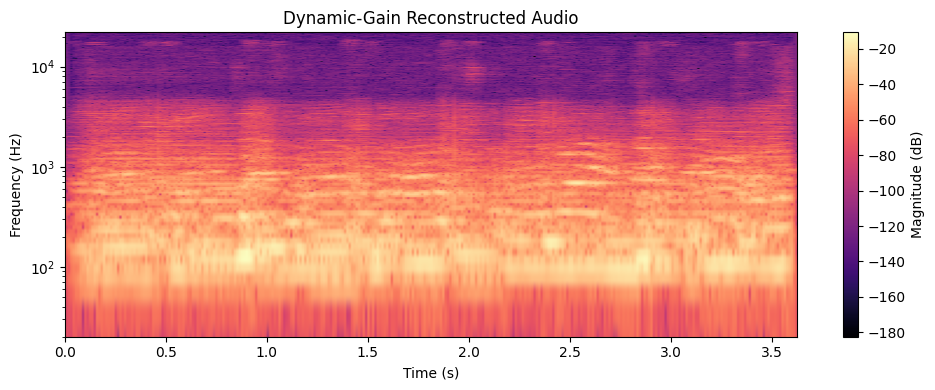

In [8]:
# %% [markdown]
# ## 4️⃣ Listen to Dynamic Reconstruction

# %%
print("▶️ Clean audio:")
ipd.display(ipd.Audio(x, rate=sr_c))

print("▶️ True noisy audio:")
ipd.display(ipd.Audio(y_aligned, rate=sr_c))

print("▶️ Dynamic reconstructed noisy audio:")
ipd.display(ipd.Audio(y_rec_dynamic, rate=sr_c))

# %% [markdown]
# ## 5️⃣ Visualize Dynamic-Gain Spectrogram Comparison

# %%
plot_spectrogram(x, sr_c, "Clean Audio")
plot_spectrogram(y_aligned, sr_c, "True Noisy Audio")
plot_spectrogram(y_rec_dynamic, sr_c, "Dynamic-Gain Reconstructed Audio")


## Even another approach (not only multiplicative noise but also additive)

Reconstruction complete: per-frame gain + additive term.
▶️ Clean audio (normalized for listening):


/var/folders/9_/fy5p9d_52f9d3dxp8df05zlc0000gn/T/ipykernel_73025/4138806244.py:43: UserWarning: NOLA condition failed, STFT may not be invertible. Possibly due to missing boundary
  _, y_rec_affine = istft(Y_hat, fs=sr_c, nperseg=n_fft, noverlap=n_fft - hop, boundary=None)


▶️ True noisy audio (normalized for listening):


▶️ Reconstructed (G(f,t) + B(f)):


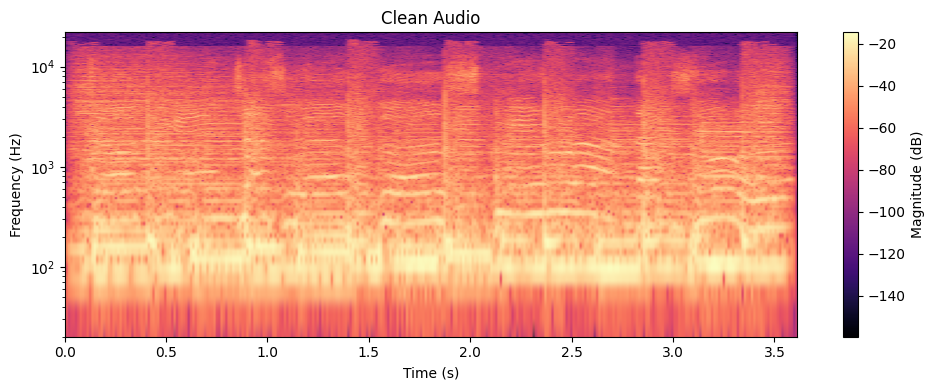

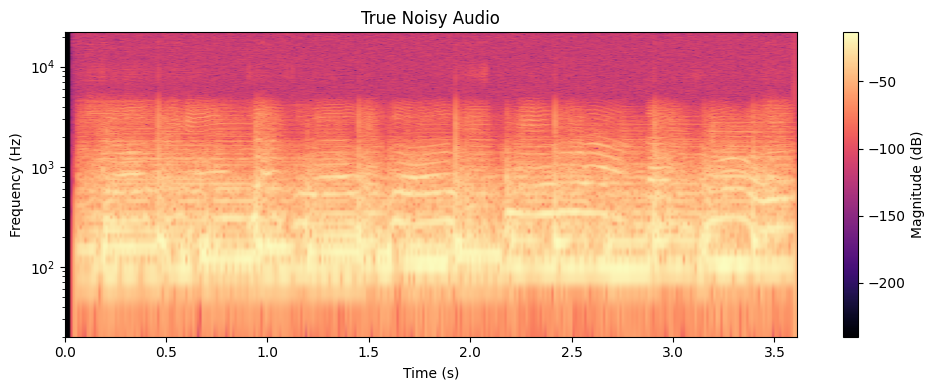

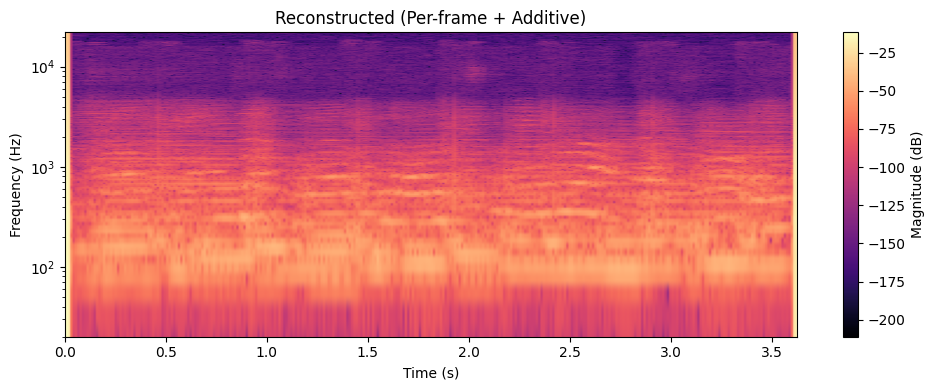

In [ ]:
# %% [markdown]
# ## 3️⃣ Compute Per-Frame Complex Gain + Additive Term (More Accurate)

# --- IMPORTANT: use the *original* x and y_aligned (not normalized) here ---
# If you normalized earlier, reload them just for estimation:
x_raw, _ = sf.read(clean_path)
y_raw, _ = sf.read(noisy_path)
x_raw = to_mono(x_raw.astype(np.float32))
y_raw = to_mono(y_raw.astype(np.float32))
y_raw, _ = align_by_xcorr(x_raw, y_raw, max_lag=sr_c)  # ensure same lag as above
minlen = min(len(x_raw), len(y_raw))
x_raw, y_raw = x_raw[:minlen], y_raw[:minlen]

# STFT params
n_fft = 4096
hop = 1024
win = get_window("hann", n_fft, fftbins=True)

# STFT (use boundary=None so analysis/synthesis line up tightly)
f, t, X = stft(x_raw, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop, boundary=None)
_, _, Y = stft(y_raw, fs=sr_c, window=win, nperseg=n_fft, noverlap=n_fft - hop, boundary=None)

# Regularized per-frame gain (weighted to avoid blow-ups when |X|≈0)
eps = 1e-12
# frequency-dependent regularizer: a small fraction of median |X|^2 at that frequency
med_pow = np.median(np.abs(X)**2, axis=1, keepdims=True) + eps
lam = 0.05 * med_pow  # tune 0.02–0.1 if needed

G_ft = (Y * np.conj(X)) / (np.abs(X)**2 + lam)

# Optional: smooth G over time to reduce jitter
import scipy.ndimage as ndi
G_ft = ndi.gaussian_filter(G_ft, sigma=(0, 1.5))  # (freq_smooth, time_smooth)

# Estimate additive noise term per frequency (time-average residual)
R_ft = Y - G_ft * X
B_f = np.median(R_ft, axis=1)   # complex, one value per frequency
# Optional: smooth B_f a bit over frequency
B_f = ndi.gaussian_filter1d(B_f, sigma=1.0)

# Reconstruct with affine model: Ŷ = G_ft * X + B_f
Y_hat = G_ft * X + B_f[:, None]
_, y_rec_affine = istft(Y_hat, fs=sr_c, nperseg=n_fft, noverlap=n_fft - hop, boundary=None)

# Match overall loudness (RMS) to the true noisy reference (better A/B)
def rms(a): return np.sqrt(np.mean(a**2) + 1e-12)
scale = rms(y_aligned) / (rms(y_rec_affine) + 1e-12)
y_rec_affine = y_rec_affine * scale

# For playback only (don’t change relative scale further)
y_rec_play = y_rec_affine / (np.max(np.abs(y_rec_affine)) + 1e-12)

print("Reconstruction complete: per-frame gain + additive term.")

# Listen
print("▶️ Clean audio (normalized for listening):")
ipd.display(ipd.Audio(x / (np.max(np.abs(x)) + 1e-12), rate=sr_c))
print("▶️ True noisy audio (normalized for listening):")
ipd.display(ipd.Audio(y_aligned / (np.max(np.abs(y_aligned)) + 1e-12), rate=sr_c))
print("▶️ Reconstructed (G(f,t) + B(f)):")
ipd.display(ipd.Audio(y_rec_play, rate=sr_c))

# Optional: compare spectrograms
plot_spectrogram(x, sr_c, "Clean Audio")
plot_spectrogram(y_aligned, sr_c, "True Noisy Audio")
plot_spectrogram(y_rec_affine, sr_c, "Reconstructed (Per-frame + Additive)")
